<a href="https://colab.research.google.com/github/yamunapusunuru124/yamuna/blob/master/projectipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import copy
from scipy import stats
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

In [18]:
stocks_df = pd.read_csv('/content/sample_data/california_housing_train.csv')
display(stocks_df)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0
2,-114.56,33.69,17.0,720.0,174.0,333.0,117.0,1.6509,85700.0
3,-114.57,33.64,14.0,1501.0,337.0,515.0,226.0,3.1917,73400.0
4,-114.57,33.57,20.0,1454.0,326.0,624.0,262.0,1.9250,65500.0
...,...,...,...,...,...,...,...,...,...
16995,-124.26,40.58,52.0,2217.0,394.0,907.0,369.0,2.3571,111400.0
16996,-124.27,40.69,36.0,2349.0,528.0,1194.0,465.0,2.5179,79000.0
16997,-124.30,41.84,17.0,2677.0,531.0,1244.0,456.0,3.0313,103600.0
16998,-124.30,41.80,19.0,2672.0,552.0,1298.0,478.0,1.9797,85800.0


In [24]:
# Sorting the data by 'median_house_value' since 'Date' is not an available column.
stocks_df = stocks_df.sort_values(by=['median_house_value'])
display(stocks_df)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
568,-117.02,36.40,19.0,619.0,239.0,490.0,164.0,2.1000,14999.0
16801,-123.17,40.31,36.0,98.0,28.0,18.0,8.0,0.5360,14999.0
16643,-122.74,39.71,16.0,255.0,73.0,85.0,38.0,1.6607,14999.0
3226,-117.86,34.24,52.0,803.0,267.0,628.0,225.0,4.1932,14999.0
7182,-118.33,34.15,39.0,493.0,168.0,259.0,138.0,2.3667,17500.0
...,...,...,...,...,...,...,...,...,...
15324,-122.28,37.49,25.0,7335.0,1157.0,2626.0,1049.0,6.5475,500001.0
1624,-117.23,33.01,18.0,3961.0,511.0,1541.0,470.0,11.1118,500001.0
7478,-118.36,34.12,26.0,3902.0,610.0,1468.0,632.0,8.5136,500001.0
7479,-118.36,34.11,35.0,3946.0,695.0,1361.0,620.0,6.5195,500001.0


In [25]:
# Printing the number of stocks
print('Total Number of stocks: {}'.format(len(stocks_df.columns[1:])))

Total Number of stocks: 8


In [26]:
# Printing the name of stocks

for i in stocks_df.columns[1:]:
  print(i)

latitude
housing_median_age
total_rooms
total_bedrooms
population
households
median_income
median_house_value


In [27]:
# Checking if data contains any null values
stocks_df.isnull().sum()

,0
longitude,0
latitude,0
housing_median_age,0
total_rooms,0
total_bedrooms,0
population,0
households,0
median_income,0
median_house_value,0


In [28]:
# Getting dataframe info
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17000 entries, 568 to 215
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           17000 non-null  float64
 1   latitude            17000 non-null  float64
 2   housing_median_age  17000 non-null  float64
 3   total_rooms         17000 non-null  float64
 4   total_bedrooms      17000 non-null  float64
 5   population          17000 non-null  float64
 6   households          17000 non-null  float64
 7   median_income       17000 non-null  float64
 8   median_house_value  17000 non-null  float64
dtypes: float64(9)
memory usage: 1.3 MB


In [31]:
import matplotlib.pyplot as plt

def show_plot(df, fig_title, x_col):
  df.plot(x = x_col, figsize = (15,7), linewidth = 3, title = fig_title)
  plt.grid()
  plt.show()

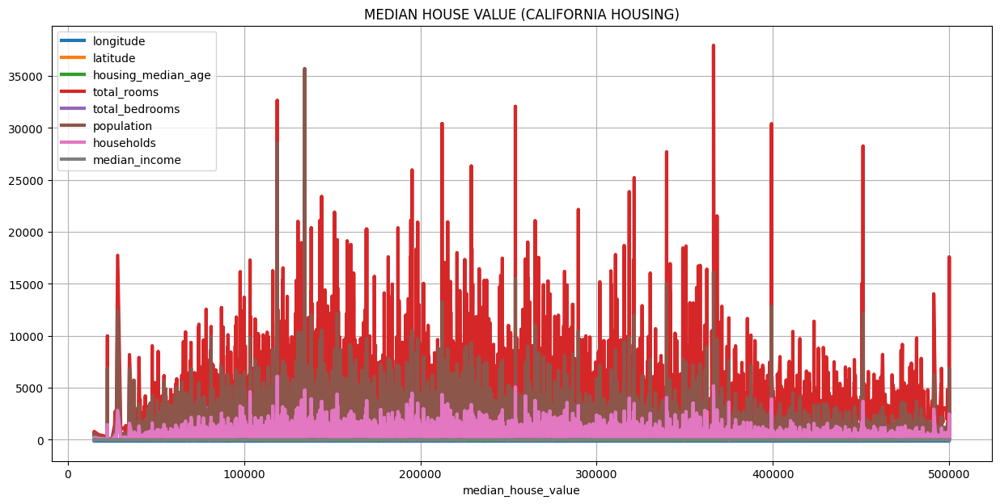

In [32]:
# Plot the data using 'median_house_value' as the x-axis
show_plot(stocks_df, 'MEDIAN HOUSE VALUE (CALIFORNIA HOUSING)', 'median_house_value')

In [35]:
import plotly.express as px

def interactive_plot(df, title, x_col):
  fig = px.line(title = title)

  # Loop through each column for y-axis (excluding the x_col itself)
  for col in df.columns:
    if col != x_col:
      fig.add_scatter(x = df[x_col], y = df[col], name = col)

  fig.show()

In [36]:
# Plot interactive chart
interactive_plot(stocks_df, 'California Housing Data Features vs Median House Value', 'median_house_value')

In [38]:
# Calculating daily percentage change for 'median_house_value' as 'sp500' is not present.
df = stocks_df['median_house_value']
df_daily_return = df.copy()

# Looping through every element in the dataframe
for j in range(1, len(df)):

  # Calculating the percentage of change from the previous day
  df_daily_return.iloc[j] = ((df.iloc[j] - df.iloc[j-1]) / df.iloc[j-1]) * 100

# Putting zero in the first line item
df_daily_return.iloc[0] = 0
display(df_daily_return)

,median_house_value
568,0.000000
16801,0.000000
16643,0.000000
3226,0.000000
7182,16.674445
...,...
15324,0.000000
1624,0.000000
7478,0.000000
7479,0.000000


In [39]:
# Defining a function to calculate stocks daily returns (for all stocks)
def daily_return(df):
  df_daily_return = df.copy()

  # Loop through each stock (while ignoring time columns with index 0)
  for i in df.columns[1:]:

    # Loop through each row belonging to the stock
    for j in range(1, len(df)):

      # Calculate the percentage of change from the previous day
      df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100

    # set the value of first row to zero since the previous value is not available
    df_daily_return[i][0] = 0

  return df_daily_return

In [40]:
# Getting the daily returns
stocks_daily_return = daily_return(stocks_df)
stocks_daily_return


/tmp/ipykernel_1097/2620491544.py:12: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/tmp/ipykernel_1097/2620491544.py:15: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained ass

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
568,-117.02,11.553785,171.428571,-90.451951,-75.512295,-85.010707,-83.681592,-63.387845,-93.231498
16801,-123.17,3.094629,16.129032,-76.555024,-65.853659,-94.495413,-90.123457,-80.684685,-87.583609
16643,-122.74,3.789859,-54.285714,-93.529561,-88.682171,-94.904077,-93.870968,-62.127708,-95.278879
3226,-117.86,1.874442,271.428571,-81.497696,-63.967611,-58.272425,-66.417910,-44.588630,-97.000206
7182,-118.33,0.000000,-11.363636,-62.679788,-44.554455,-45.010616,-54.152824,-44.546498,-94.725738
...,...,...,...,...,...,...,...,...,...
15324,-122.28,0.000000,-13.793103,76.832208,82.204724,60.317460,67.304625,-5.273437,9.361549
1624,-117.23,-0.241765,157.142857,-25.545113,-40.233918,-23.523573,-38.802083,75.339656,78.827253
7478,-118.36,-0.029300,-27.777778,-43.210595,-48.305085,-33.754513,-44.070796,5.760320,0.888015
7479,-118.36,-0.029308,34.615385,1.127627,13.934426,-7.288828,-1.898734,-23.422524,0.000000


In [42]:
# Daily Return Correlation
cm = stocks_daily_return.corr()

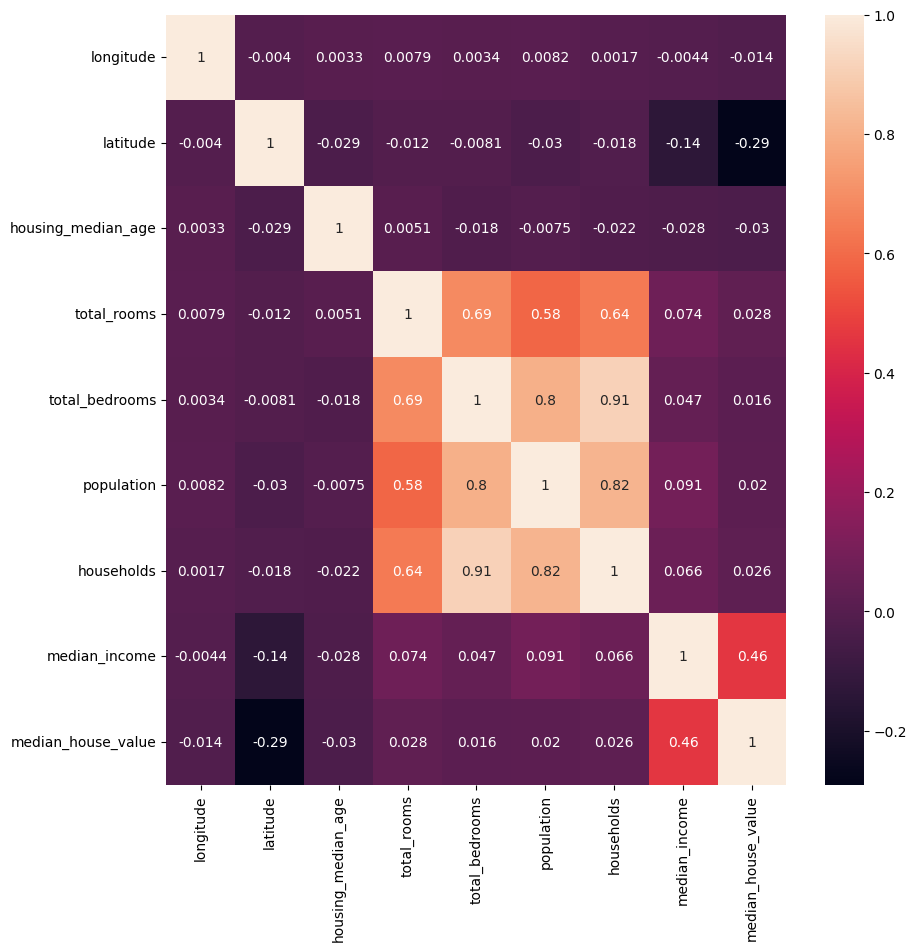

In [43]:
plt.figure(figsize=(10, 10))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax);

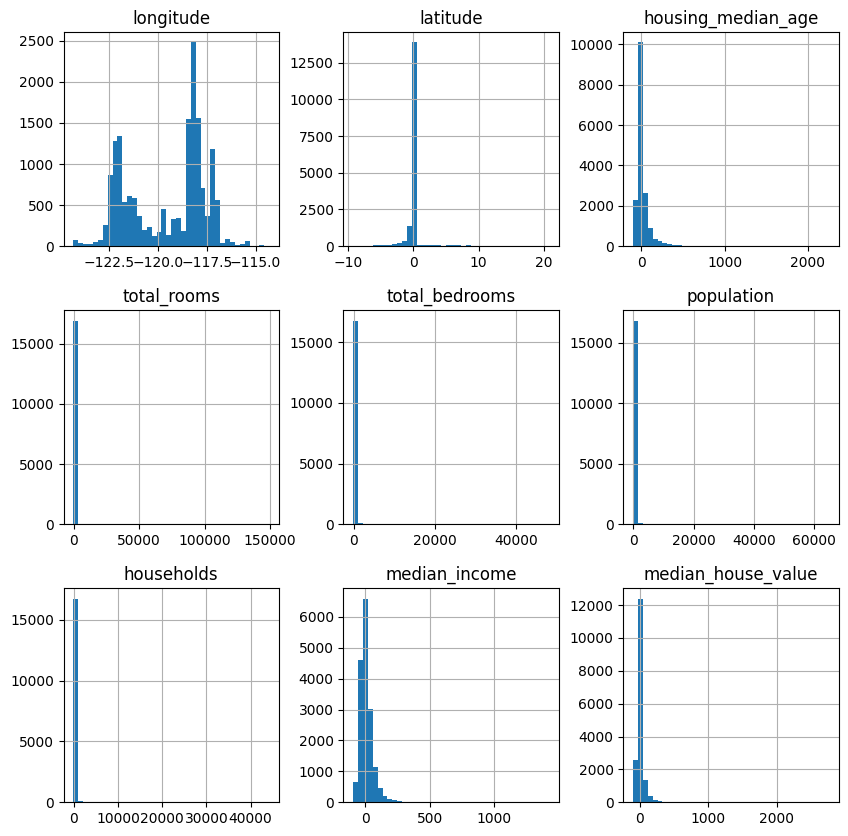

In [44]:
# Stock returns are normally distributed with zero mean
stocks_daily_return.hist(figsize=(10, 10), bins = 40);

In [46]:
# Grouping all data returns together in a list
# Making a copy of the daily returns dataframe
df_hist = stocks_daily_return.copy()

# Dropping the date (removed as 'Date' column does not exist)

data = []

# Looping through every column
for i in df_hist.columns:
  data.append(stocks_daily_return[i].values)
data

[array([-117.02, -123.17, -122.74, ..., -118.36, -118.36, -116.43]),
 array([11.55378486,  3.09462916,  3.78985886, ..., -0.02929974,
        -0.02930832, -0.17746229]),
 array([171.42857143,  16.12903226, -54.28571429, ..., -27.77777778,
         34.61538462, 200.        ]),
 array([-90.45195126, -76.55502392, -93.52956103, ..., -43.21059526,
          1.12762686, -61.31147541]),
 array([-75.51229508, -65.85365854, -88.68217054, ..., -48.30508475,
         13.93442623, -67.38644825]),
 array([-85.01070664, -94.49541284, -94.90407674, ..., -33.75451264,
         -7.28882834, -77.13871435]),
 array([-83.68159204, -90.12345679, -93.87096774, ..., -44.07079646,
         -1.89873418, -69.65428937]),
 array([-63.38784476, -80.68468468, -62.1277081 , ...,   5.76032   ,
        -23.42252396,   7.10899128]),
 array([-93.23149819, -87.58360927, -95.27887945, ...,   0.88801453,
          0.        , 334.40573414])]

In [47]:
# Plotly's Python API contains a super powerful module known as figure factory module
# Figure factory module includes wrapper functions that create unique chart types such as interactive subplots
fig = ff.create_distplot(data, df_hist.columns)
fig.show()

In [48]:
# Calculating the mean values
stocks_df.mean()

,0
longitude,-119.562108
latitude,35.625225
housing_median_age,28.589353
total_rooms,2643.664412
total_bedrooms,539.410824
population,1429.573941
households,501.221941
median_income,3.883578
median_house_value,207300.912353


In [49]:
# Calculating the standard deviation of stocks (Volatility)
stocks_df.std()

,0
longitude,2.005166
latitude,2.137340
housing_median_age,12.586937
total_rooms,2179.947071
total_bedrooms,421.499452
population,1147.852959
households,384.520841
median_income,1.908157
median_house_value,115983.764387


In [50]:
# Statistical data of the dataframe
stocks_df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000
mean,-119.562108,35.625225,28.589353,2643.664412,539.410824,1429.573941,501.221941,3.883578,207300.912353
std,2.005166,2.137340,12.586937,2179.947071,421.499452,1147.852959,384.520841,1.908157,115983.764387
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.790000,33.930000,18.000000,1462.000000,297.000000,790.000000,282.000000,2.566375,119400.000000
50%,-118.490000,34.250000,29.000000,2127.000000,434.000000,1167.000000,409.000000,3.544600,180400.000000
75%,-118.000000,37.720000,37.000000,3151.250000,648.250000,1721.000000,605.250000,4.767000,265000.000000
max,-114.310000,41.950000,52.000000,37937.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [51]:
# Function to normalize the prices based on the initial price
# The function simply divides every stock by it's price at the start date (i.e.: Date = 2012-01-12)
def normalize(df):
  x = df.copy()

  # Loop through each stock (while ignoring time columns with index 0)
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

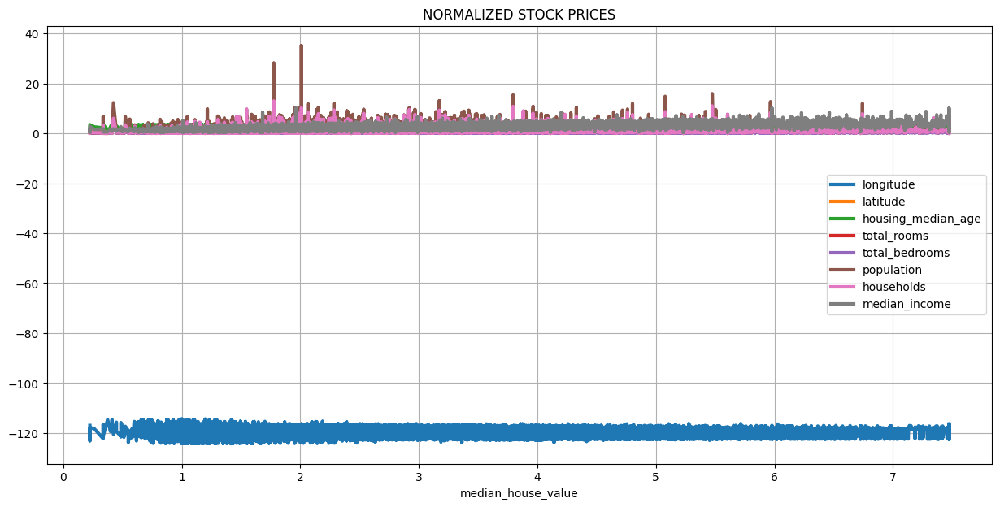

In [53]:
# Plotting normalized data
show_plot(normalize(stocks_df), 'NORMALIZED STOCK PRICES', 'median_house_value')

In [55]:
# Plotting normalized interactive chart
interactive_plot(normalize(stocks_df), 'Normalized Prices', 'median_house_value')

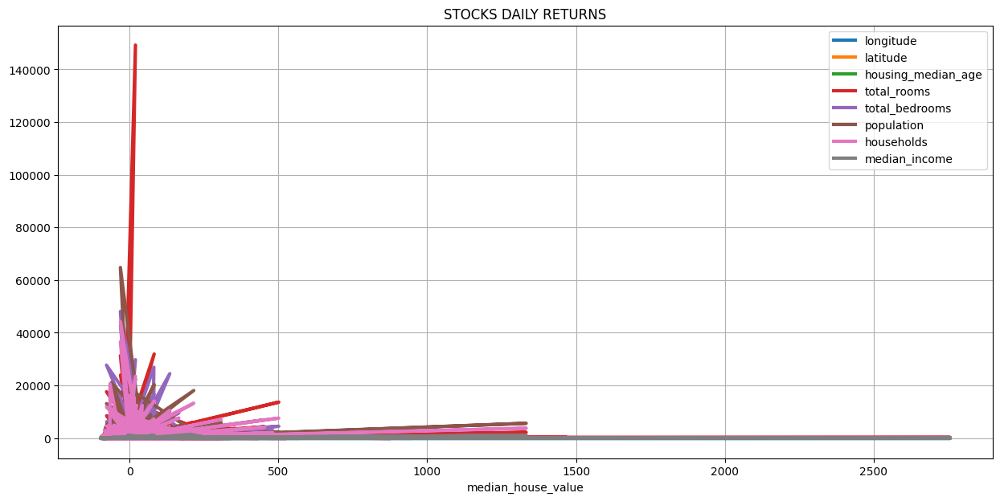

In [57]:
# Plotting the daily returns
show_plot(stocks_daily_return, 'STOCKS DAILY RETURNS', 'median_house_value')

In [59]:
# Plotting the interactive chart
interactive_plot(stocks_daily_return, 'STOCKS DAILY RETURNS', 'median_house_value')